# Caltech UCSD Birds 200 2011 (CUB-200-2011)

## Visualising the data and class sampling

In this notebook we will start looking at the contents of the dataset that we downloaded and organised in Part 1 of the notebook series.

This is the second stage of our roadmap for building and understanding a birds image classifier:

![RoadMapImage](../docs/birds_roadmap.png)

In this notebook we will investige:

    1. Visualising the type of image data that we have to train the networks.
    
    2. Investigating the type of image augmentation processes we might apply to improve the generality of our resulting model.
    
    3. Investigate the class sampling of the training and test sets to see how uniform each species of bird is sampled and whether remedial action is required before embarking on model training.

## Notebook setup

### Modules and externals

In [1]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, models

from imutils import paths
from pathlib import Path
import os, sys
import time
import copy

import pandas as pd
import matplotlib.pylab as plt
import numpy as np

import holoviews as hv
import hvplot
import hvplot.pandas
from bokeh.io import output_notebook
from bokeh.plotting import show

# Local modules

from cub_tools.train import train_model
from cub_tools.visualize import imshow, visualize_model, get_title_string_from_classes
from cub_tools.transforms import resizeCropTransforms, makeDefaultTransforms, makeAggresiveTransforms

In [2]:
output_notebook()

Loading BokehJS ...

### Runtime setup

**root_dir** is the path to the directory where the downloaded CUB-200-2011 data resides.

**data_dir** is the folder name that all the images are stored in, sorted into sub-directories of train and test sets, and filed under class name directories.

**batch_size** controls the number of images pulled from the dataset in a given iteration. In this script it controls the number of images that are being plotted.

**nrows_plot** controls the number of rows in the image grids.

In [3]:
# Script runtime options
root_dir = '../data'
data_dir = os.path.join(root_dir,'images')

batch_size=16
nrows_plot=4

## Visualise some input data

### View some randomly chosen images from the training set

In this section, we use the dataloader object that we created in the previous section, to return a batch of images from the training set, and then plot them for visual purposes.

In the first part, we will simply load a batch of data without any augmentations, other than to make the images the same size.

In the second part we will look at the transform which will be used in the neural network training process, to include random cropping, to provide image variability during the training epochs.

In [4]:
data_transforms = resizeCropTransforms(img_resize=256, img_crop_size=224)

In [ ]:
# Setup data loaders with augmentation transforms
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])
                  for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

In [6]:
image_datasets['train']

Dataset ImageFolder
    Number of datapoints: 5994
    Root location: ../data/images/train
    StandardTransform
Transform: Compose(
               Resize(size=256, interpolation=PIL.Image.BILINEAR)
               CenterCrop(size=(224, 224))
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

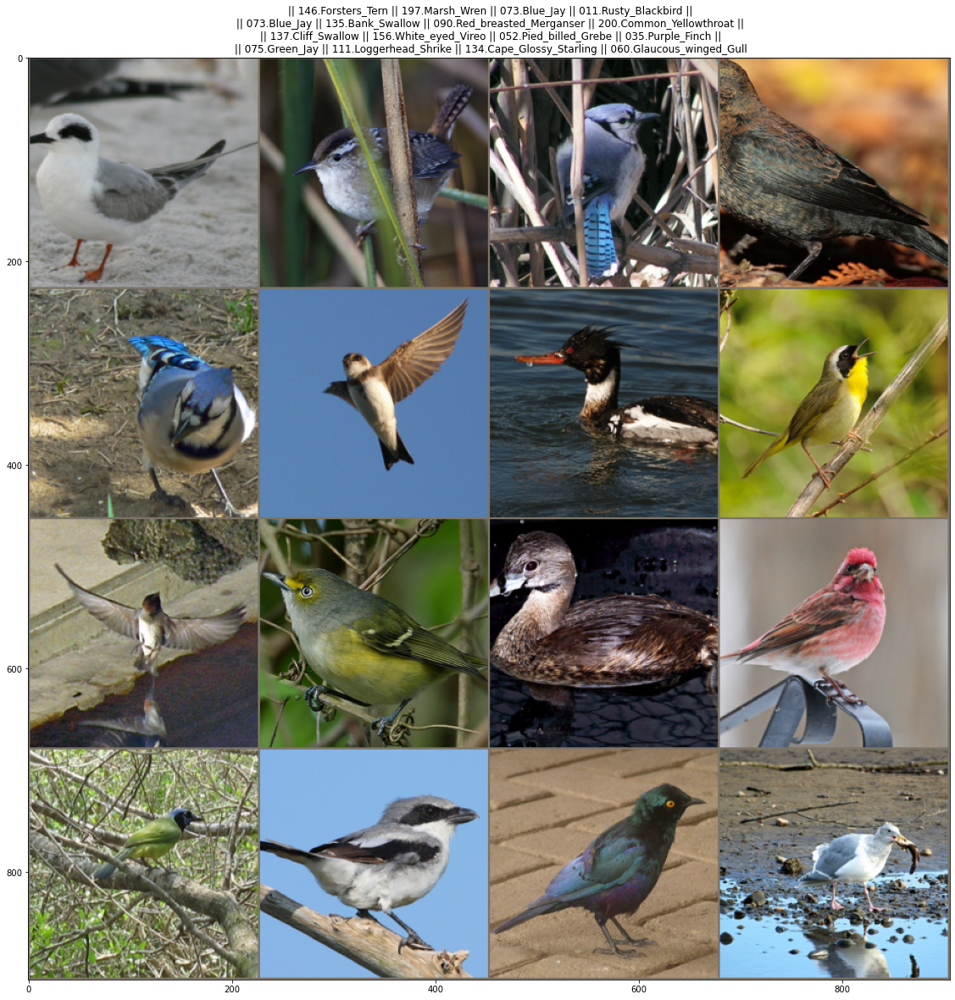

In [ ]:

inputs, classes = next(iter(dataloaders['train']))

out = torchvision.utils.make_grid(inputs, nrow=nrows_plot)

imshow(out, title=get_title_string_from_classes(classes, class_names), figsize=(20,20))

### Visualise the augmentations

In this section will plot some images of the training set, but this time we will look at the different types of augmentations that can be applied to the images during the training process.

Augmentation is a process of manupulating the input training data, such that it contains the same information, e.g. class and bird type, but the pixel representation of the image object has changed to some degree. This has been shown to be extremely effective in improving the performance of convolutional neural networks in classification problems. This is because, the network trains on the full training set over each major iteration, or epoch. So if the network takes say 15 epochs to arrive at its best accuracy on the test set images, then the network has seen each image in the training set 15 times. In order to avoid the network "overfitting", that is producing features that are too specific to the training set, and produce feature maps that generalize better to other images of the same class (i.e. the test set), then applying random augmentations to the images at each epoch is a good way of providing the same training set information, but not in exactly the same position. It is effectively increasing the training set size, by introducing random variations into the images that are being presented at each epoch.

#### Mild augmentations

In [8]:
data_transforms_aug = makeDefaultTransforms(img_resize=256, img_crop_size=224)

In [9]:
data_transforms_aug

{'train': Compose(
     RandomResizedCrop(size=(224, 224), scale=(0.08, 1.0), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
     RandomHorizontalFlip(p=0.5)
     ToTensor()
     Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
 ),
 'test': Compose(
     Resize(size=256, interpolation=PIL.Image.BILINEAR)
     CenterCrop(size=(224, 224))
     ToTensor()
     Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
 )}

In [10]:
aug_image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_aug[x])
                  for x in ['train', 'test']}
aug_dataloaders = {x: torch.utils.data.DataLoader(aug_image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
                                 for x in ['train', 'test']}

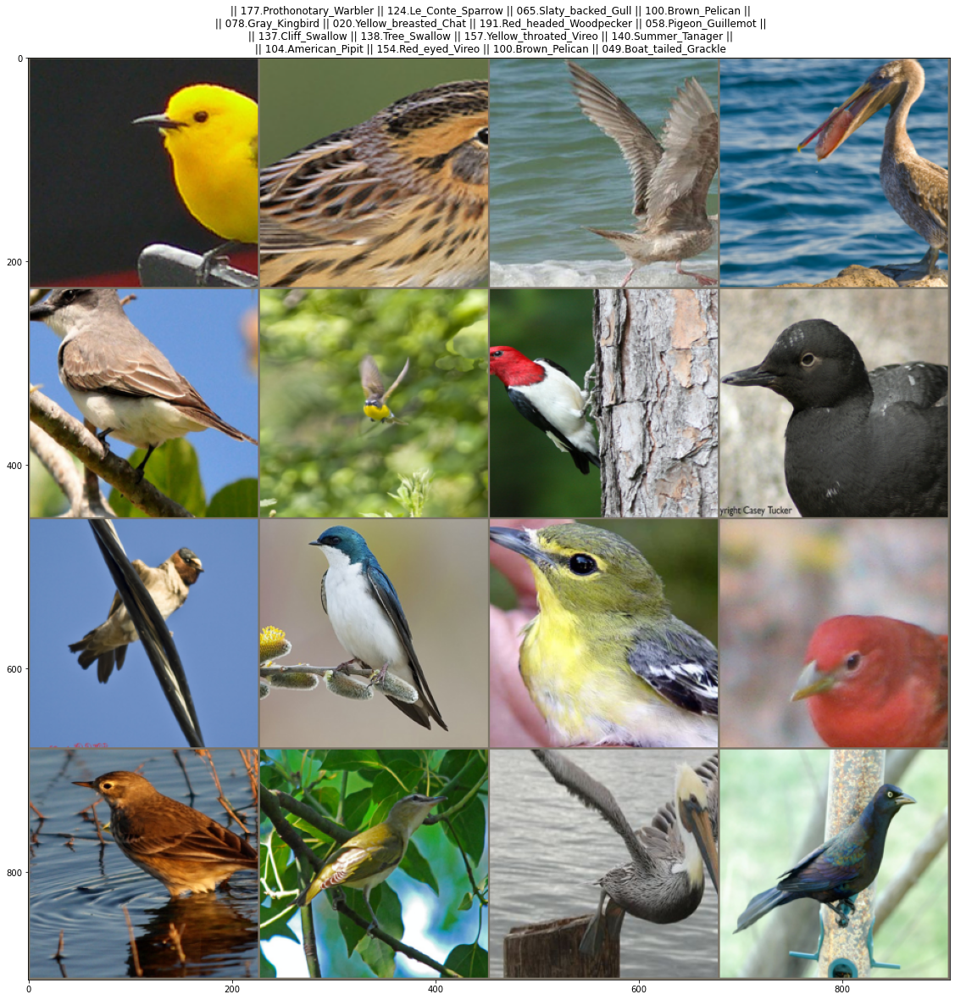

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(aug_dataloaders['train']))

out = torchvision.utils.make_grid(inputs, nrow=nrows_plot)

imshow(out, title=get_title_string_from_classes(classes, class_names), figsize=(20,20))

#### Aggressive augmentations with perspective

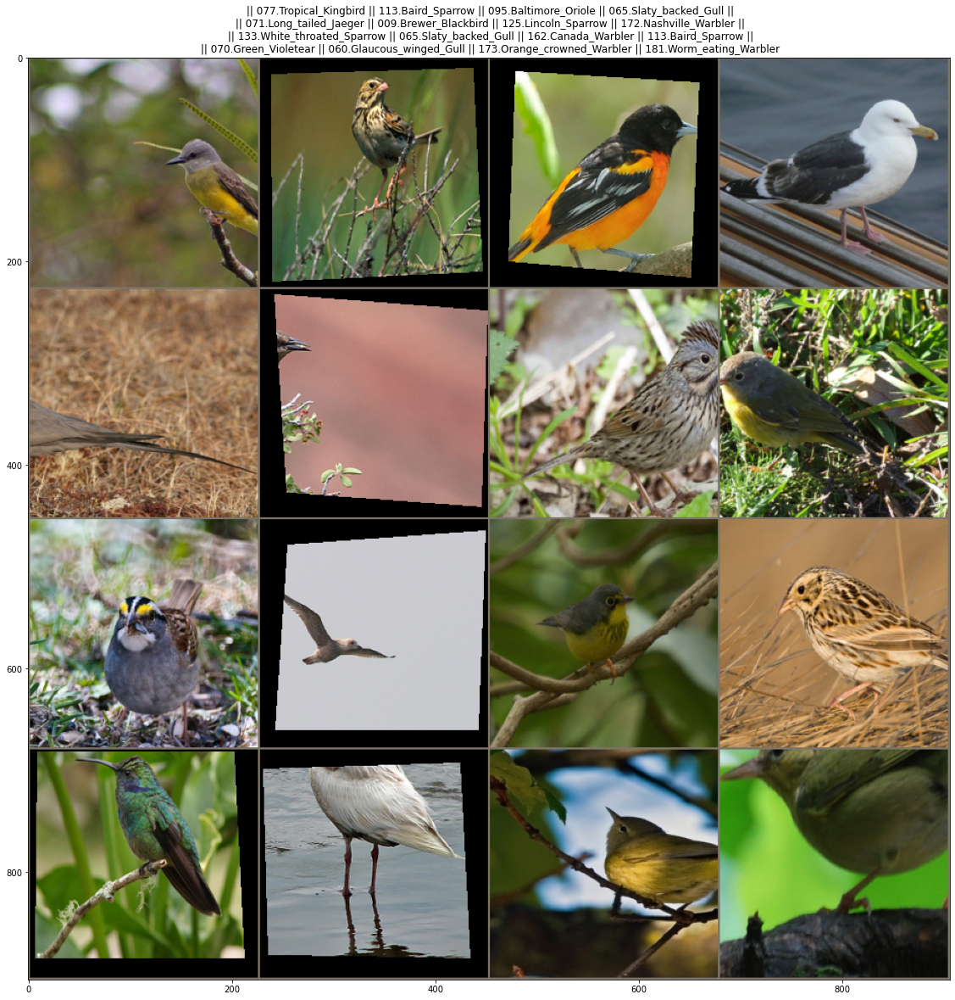

In [ ]:
data_transforms_aug = makeAggresiveTransforms(img_resize=256, img_crop_size=224, transform_type='perspective')

aug_image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_aug[x])
                  for x in ['train', 'test']}
aug_dataloaders = {x: torch.utils.data.DataLoader(aug_image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
                                 for x in ['train', 'test']}

inputs, classes = next(iter(aug_dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=nrows_plot)

imshow(out, title=get_title_string_from_classes(classes, class_names), figsize=(20,20))

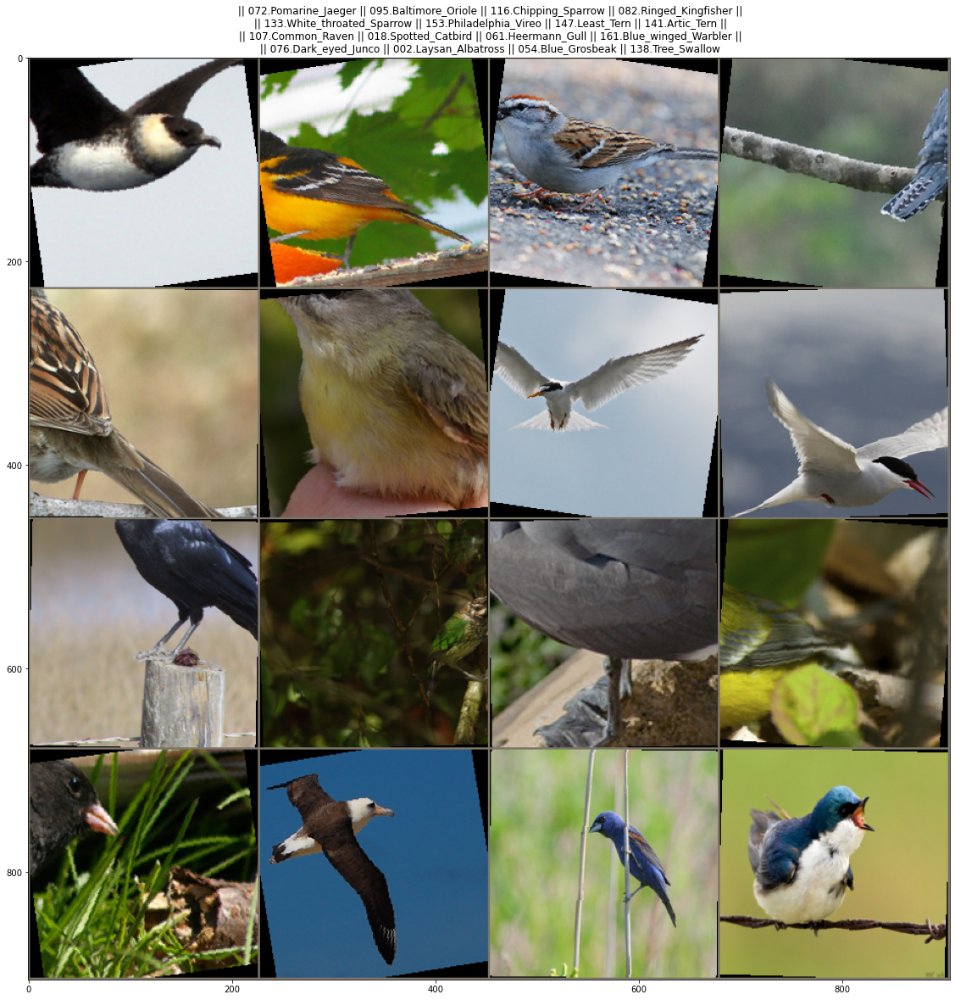

In [ ]:
data_transforms_aug = makeAggresiveTransforms(img_resize=256, img_crop_size=224, transform_type='rotation')

aug_image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_aug[x])
                  for x in ['train', 'test']}
aug_dataloaders = {x: torch.utils.data.DataLoader(aug_image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
                                 for x in ['train', 'test']}

inputs, classes = next(iter(aug_dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=nrows_plot)

imshow(out, title=get_title_string_from_classes(classes, class_names), figsize=(20,20))

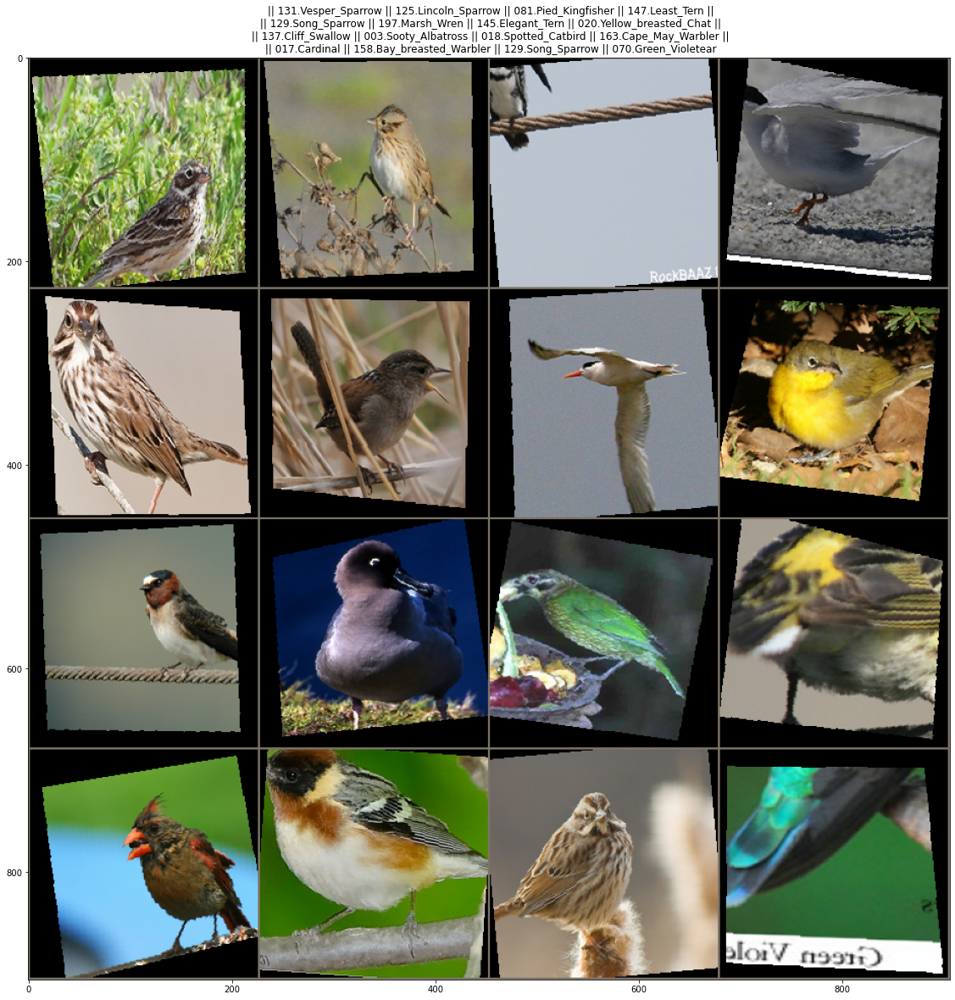

In [ ]:
data_transforms_aug = makeAggresiveTransforms(img_resize=256, img_crop_size=224, transform_type='all')

aug_image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_aug[x])
                  for x in ['train', 'test']}
aug_dataloaders = {x: torch.utils.data.DataLoader(aug_image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
                                 for x in ['train', 'test']}

inputs, classes = next(iter(aug_dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=nrows_plot)

imshow(out, title=get_title_string_from_classes(classes, class_names), figsize=(20,20))

## Class Sampling

In this section we will visualize the class sampling distribution, that is, the number of individual images we have in the training and test sets. Most machine learning algorithms are sensitive to the number of samples in each of the classes of the data, and in general, there should be an equal number of samples in each class to avoid biasing the algorithm predictions towards the oversampled classes. Without correction of significant biasing, performance in the undersampled classes can be much poorer than the oversampled class, so care and attention must be given to understanding the sampling of the training set.

### Create the dataset class sampling tables

Here we build a dictionary which contains the number of images in each class for the train and test image sets. This is achieved by looping over the train and test keys in the image dataset object, and testing the **targets** attribute of the image dataset object. This contains the class ID of every image in the training or test sets, and the inner loop tests the targets vector for each class respectively. This produces a booleen array of size of number of images, with 1 where the image has the current tested class and zero where it does not. Summing these together gives the total number of images in that class, in that dataset.

In [15]:
class_sampling = {'train' : {}, 'test' : {}}
for stage in ['train','test']:
    for i_class, class_name in enumerate(class_names):
        class_sampling[stage][class_name] = (np.array(image_datasets['test'].targets) == i_class).sum()

### Plotting the class samples

Now we are taking the class sampling dictionary that we created above and plotting for visualisation purposes. In this plot we can then look at the relative sampling density between the classes and make an assessment as to whether there is  a need for balancing of the classes. In the case of imbalanced class sampling there are a number of ways in which we can achieve class sampling parity, and the application of each particular method is problem specific. The most effective way of solving class imbalances is of course to find additional data of the 

    1. Over, under sampling - We can make the decision to increase/decrease the amount of samples in each class by either removing excess samples in the oversampled class, such that all classes have the number of samples. Furthermore, a similar approach may be achieved by creating duplicate data of the under sampled class, such that it has the same number of samples as the others. In either case, these approaches are to be used with care as they are either throwing away valuable data, or duplicating data, such that no new information is being provided. These approaches should be used with care, to ensure that the number of samples in each class is reasonable for the algorithm that is being trained. For example, undersampling may be desirable to oversampling, but this will only work if the number of samples in the undersampled class is adequate for algorithm that is to be trained. Furthermore, care must be taken that the undersampling of the over sampled classes in performed in such a way that it generates a representative reduced set of the full data.
    
    2. Synthetic data generation - A family of algorithms based on unsupervised clustering approaches (SMOTE) can be applied to numeric data, to generate new samples for undersampled classes, thus bringing up the number of samples to equal the other classes. Rather than simply creating duplicates of the existing data, SMOTE and other varients attempt to characterise the existing data space and produce randomised samples from that space, such that the new data points are synthetically generated. It is worth noting that whilst this approach can work better than duplication, it is again not adding any new information, it is simply populating the distribution space occupied by the existing data. Care must be taken to ensure that the generated data is behaving correctly. It is also important to understand that if there is potential bias in the undersampled classes, such that a full range of potential outcomes have not been sampled by the undersampled class, then SMOTE will not generate representations from this missing data. The only to solve that problem is to either get more data, taking care to sample the undersampled region of the distribution, or synthetically generate data from modelling approximations of the problem at hand (not always possible).
    

In any of these cases, the best outcome is to get more data to balance the class sampling.

#### Training set visualisation

Visualising the training set sampling for the data base over the 200 classes.

This is performed using a static plotting tool (matplotlib) and a dynamic interactive plot (hvplot, bokeh).

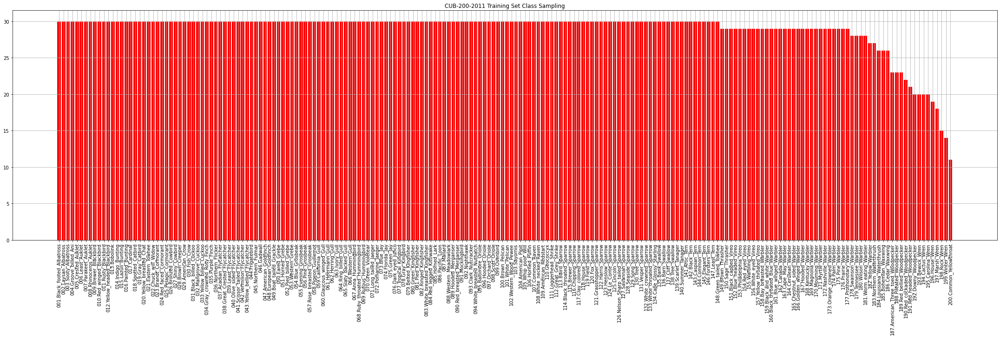

In [16]:
plt.figure(figsize=(30,10))
plt.bar(x=class_names, height=pd.DataFrame(class_sampling)['train'].sort_values(ascending=False),color='red')
plt.xticks(rotation=90)
plt.tight_layout()
plt.grid(True)
plt.title('CUB-200-2011 Training Set Class Sampling')
plt.show()

In [17]:
p = pd.DataFrame(class_sampling)['train'].sort_values(ascending=False).hvplot.bar(stacked=False, rot=90, frame_width=1600, frame_height=400)
p = hv.render(p)
show(p)

#### Test set visualisation

Visualising the test set sampling for the data base over the 200 classes.

This is performed using a static plotting tool (matplotlib) and a dynamic interactive plot (hvplot, bokeh).

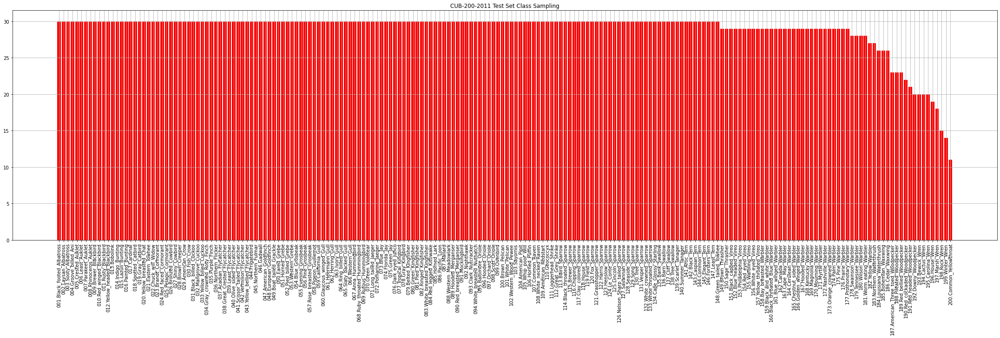

In [18]:
plt.figure(figsize=(30,10))
plt.bar(x=class_names, height=pd.DataFrame(class_sampling)['test'].sort_values(ascending=False),color='red')
plt.xticks(rotation=90)
plt.tight_layout()
plt.grid(True)
plt.title('CUB-200-2011 Test Set Class Sampling')
plt.show()

In [19]:
p = pd.DataFrame(class_sampling)['test'].sort_values(ascending=False).hvplot.bar(stacked=False, rot=90, frame_width=1600, frame_height=400)
p = hv.render(p)
show(p)

# Exploratory Data Analysis

Exploratory Data Analysis (EDA) is the critical first step in any data science project. It helps us understand the dataset, identify issues, and inform downstream processing and modeling decisions. In this section, we will:

1. **Perform a data quality check** to detect corrupted images.  
2. **Analyze image statistics** (sizes, distributions) to guide preprocessing.  
3. **Identify dataset biases** to select appropriate augmentation strategies.

---

## Question 1: Are there corrupted images in the CUB-200-2011 dataset?

Data cleaning ensures that our inputs are valid. To detect any all‑one‑color or otherwise corrupted images, we compute the **standard deviation** of pixel values for each image. All images have a standard deviation > 0, confirming there are no single‑color (corrupted) files.

---

## Question 2: What is an optimal image transformation strategy?

To standardize inputs, we must understand their native sizes. We examine the distribution of **widths** and **heights** across the dataset and find that image dimensions vary up to 500 × 500 px, with common sizes around 375 × 500 px. These statistics will inform our resizing and padding strategy.

---

## Question 3: Are there image‑specific biases that could limit model performance?

We investigate the spatial distribution of birds by resizing all images to 500 × 500 px, computing a pixel‑wise average, and visualizing the result. The average image reveals a clear **center bias**—most birds appear near the center. Without correction, a model may over‑focus on central regions and underperform on off‑center birds.

---

# Data Preparation

Based on our EDA findings, we will apply a **data‑driven augmentation pipeline**:

1. **Resize & Pad to 500×500 px**  
   - Preserve aspect ratio by padding shorter sides to reach 500 px.  
2. **Mitigate Center Bias**  
   - **Training augmentations:** random crops, horizontal/vertical flips, and brightness adjustments.  
   - **Test preprocessing:** center‑crop to 375 × 375 px (aligned with common bird positions).  
3. **Normalization**  
   - Scale pixel values using ImageNet mean and standard deviation.  
4. **Dataset Splits**  
   - Organize into **train**, **test**, and **validation** folders for robust model evaluation.

With these steps, our model will be exposed to varied positions and appearances of birds, improving its generalization beyond the dataset’s center bias.
